## House Price Prediction using Linear, Ridge and Lasso Regression

### Problem Statement

- A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia.

- The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

##### The company wants to know:

- Which variables are significant in predicting the price of a house, and
- How well those variables describe the price of a house.

`Also, determine the optimal value of lambda for ridge and lasso regression`.



### Business Goal 

You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

## The solution is divided into the following sections: 

- Importing the required library
- Data understanding and exploration
- Data cleaning and Visulation
    - Missing value treatment
    - Data visulation
    - Outlier detection and treatment
- Data preparation
    - Dummy variable Creation
    - Train - Test split
    - Scaling the features
    - Split into X (InDependent) and y (Dependent)
- Model building and evaluation
    - Liner Regression model
    - Ridge Regression model
    - Lasso Regression model
    - Model Comparision
    - Inferences for "Surprise Housing"
- Exploring answers of subjective questions

## Importing the required library

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE

from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score

# Visualisations to understand the presence and distribution of missing data within a pandas dataframe
import missingno as msno

import warnings
warnings.filterwarnings('ignore')


## Data understanding and exploration

In [3]:
# Let's override the pandas default options for data display before reading the dataset

pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


# Read the dataset
df_main = pd.read_csv('train.csv')

# Check the head of the dataset
df_main.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
# Data shape and information
print('Shape -', df_main.shape)
print('\n')
print(df_main.info())

print('\n')
print('Total Rows - {} and Total columns {}'.format(df_main.shape[0], df_main.shape[1]))

Shape - (1460, 81)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   

In [5]:
# Checking stats of the dataset

df_main.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [6]:
# Let's deep look into datatypes of columns
df_main.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

## Data cleaning and Visulation

#### Missing value treatment

In [7]:
# Check for duplicatele records and drop if any
print('Total duplicate - {} '.format(len(df_main[df_main.duplicated()])))

# Let's check row wise duplicate records in load data set based on load id ('id' column)
print(df_main.duplicated(subset='Id').sum())

print('No duplicated records found.')

Total duplicate - 0 
0
No duplicated records found.


In [8]:
# Checking null values on row basis
df_main.isna().sum(axis=1)

0        5
1        4
2        4
3        4
4        4
5        3
6        4
7        4
8        4
9        4
10       5
11       4
12       6
13       4
14       4
15       4
16       4
17       9
18       5
19       4
20       4
21       2
22       4
23       4
24       4
25       4
26       5
27       4
28       4
29       5
30       3
31       5
32       5
33       4
34       4
35       4
36       5
37       4
38       5
39      15
40       3
41       4
42       5
43       5
44       5
45       4
46       4
47       5
48      10
49       4
50       6
51       2
52       5
53       4
54       3
55       4
56       4
57       5
58       4
59       4
60       5
61       5
62       4
63       4
64       5
65       4
66       5
67       5
68       5
69       4
70       4
71       5
72       4
73       4
74       5
75       4
76       6
77       4
78      10
79       3
80       4
81       5
82       4
83       5
84       4
85       4
86       4
87       4
88       9
89      10
90      10

In [9]:
# Let's check columns wise null record counts
print(df_main.isna().sum())

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [10]:
# Let's check columns wise null record in percentage
print((df_main.isna().sum() / len(df_main)) * 100)

Id                0.000000
MSSubClass        0.000000
MSZoning          0.000000
LotFrontage      17.739726
LotArea           0.000000
Street            0.000000
Alley            93.767123
LotShape          0.000000
LandContour       0.000000
Utilities         0.000000
LotConfig         0.000000
LandSlope         0.000000
Neighborhood      0.000000
Condition1        0.000000
Condition2        0.000000
BldgType          0.000000
HouseStyle        0.000000
OverallQual       0.000000
OverallCond       0.000000
YearBuilt         0.000000
YearRemodAdd      0.000000
RoofStyle         0.000000
RoofMatl          0.000000
Exterior1st       0.000000
Exterior2nd       0.000000
MasVnrType        0.547945
MasVnrArea        0.547945
ExterQual         0.000000
ExterCond         0.000000
Foundation        0.000000
BsmtQual          2.534247
BsmtCond          2.534247
BsmtExposure      2.602740
BsmtFinType1      2.534247
BsmtFinSF1        0.000000
BsmtFinType2      2.602740
BsmtFinSF2        0.000000
B

In [11]:
# Check for empty columns
empty_columns = df_main.columns[df_main.isna().all()].tolist()

print(f"No of fully empty Columns: {len(empty_columns)} \n")
print(f"Fully Empty Columns List: \n {empty_columns}")

No of fully empty Columns: 0 

Fully Empty Columns List: 
 []


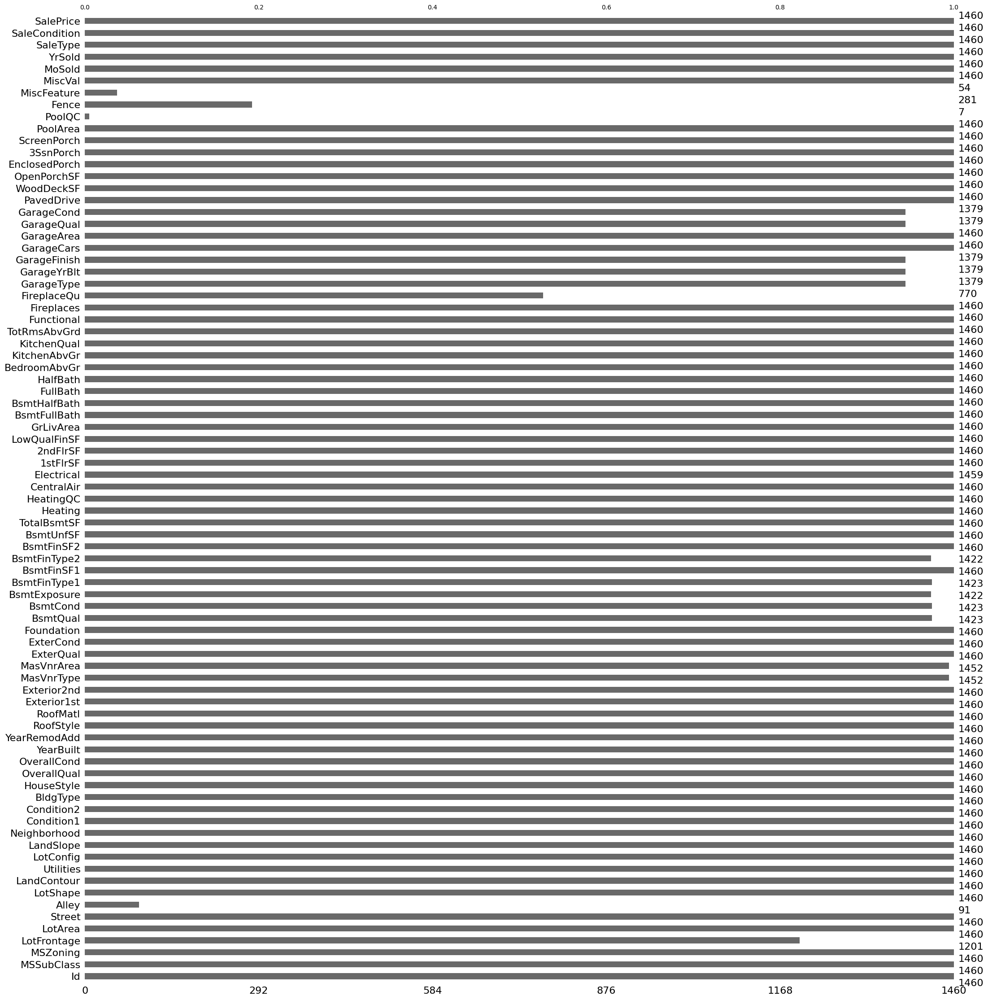

In [12]:
# Let's visualise coluns missing values in chart using missingno

msno.bar(df_main)
plt.show()

In [13]:
# Let's check all high percenatge null values

df_null = (df_main.isna().sum() / len(df_main)) * 100
df_null = df_null[df_null > 0]
df_null.sort_values(inplace=True, ascending=False)
df_null


PoolQC          99.520548
MiscFeature     96.301370
Alley           93.767123
Fence           80.753425
FireplaceQu     47.260274
LotFrontage     17.739726
GarageType       5.547945
GarageYrBlt      5.547945
GarageFinish     5.547945
GarageQual       5.547945
GarageCond       5.547945
BsmtExposure     2.602740
BsmtFinType2     2.602740
BsmtFinType1     2.534247
BsmtCond         2.534247
BsmtQual         2.534247
MasVnrArea       0.547945
MasVnrType       0.547945
Electrical       0.068493
dtype: float64

In [14]:
# Let's drop the columns keeping more than 70 percentage null values
cols_to_drop = df_null[df_null>70]
cols_to_drop = cols_to_drop.keys()
cols_to_drop = cols_to_drop.tolist()
cols_to_drop

['PoolQC', 'MiscFeature', 'Alley', 'Fence']

In [15]:
df_clean = df_main.drop(cols_to_drop, axis=1)
df_clean.shape

(1460, 77)

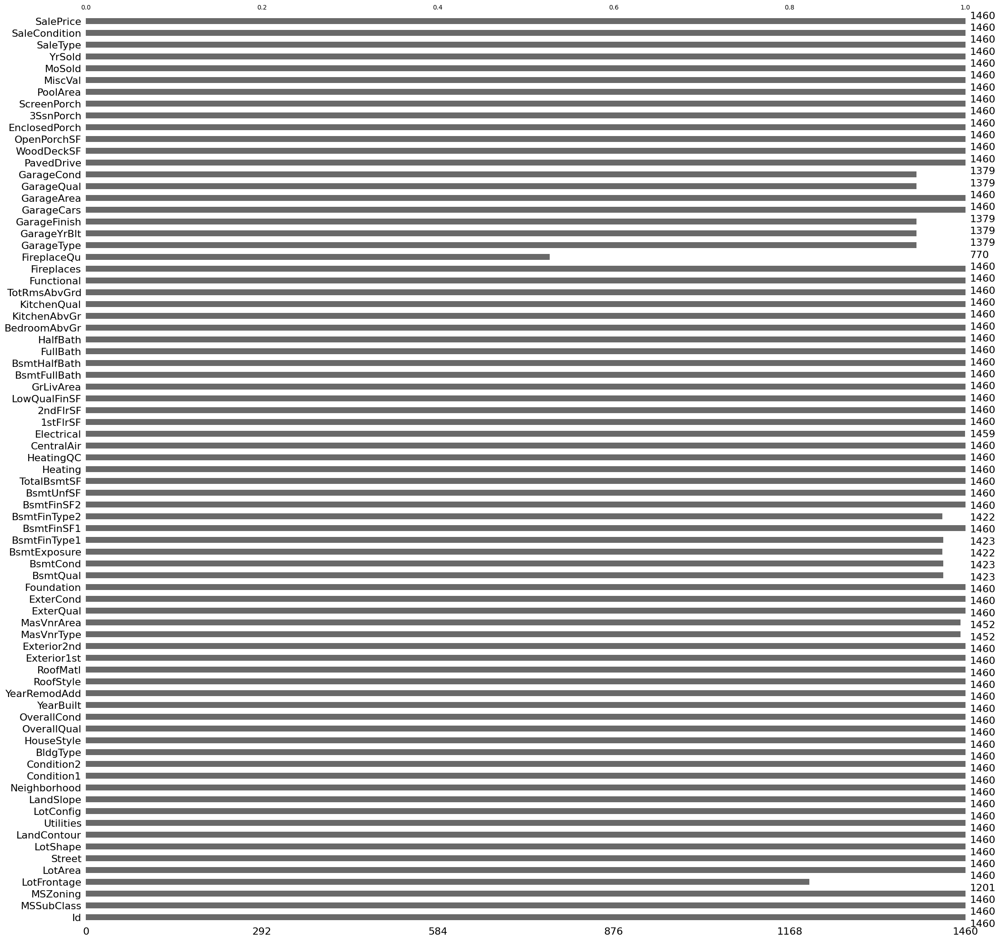

In [16]:
# After filling missing values, below is the visualization for column wise available value counts
msno.bar(df_clean)
plt.show()

In [17]:
# Print the available datatypes in the dataset
df_clean.dtypes.value_counts()

object     39
int64      35
float64     3
dtype: int64

In [18]:
# Imputing the null values
null_series = df_null[df_null<70]
print(null_series)

# Get the null values columns list
null_columns = null_series.index.tolist()


# Impute the numeric colums
for col in null_columns:
    if df_clean[col].dtypes == 'int64' or df_clean[col].dtypes == 'float64':
        if df_clean[col].isnull().sum() > 0:
            df_clean[col] = df_clean[col].replace(np.NaN, df_clean[col].mean())


FireplaceQu     47.260274
LotFrontage     17.739726
GarageType       5.547945
GarageYrBlt      5.547945
GarageFinish     5.547945
GarageQual       5.547945
GarageCond       5.547945
BsmtExposure     2.602740
BsmtFinType2     2.602740
BsmtFinType1     2.534247
BsmtCond         2.534247
BsmtQual         2.534247
MasVnrArea       0.547945
MasVnrType       0.547945
Electrical       0.068493
dtype: float64


In [19]:
# Impute the categorical colums
for col in null_columns:
    mode_val = df_clean[col].mode()
    if df_clean[col].dtypes != 'int64' or df_clean[col].dtypes != 'float64':
        if df_clean[col].isnull().sum() > 0:
            print(mode_val[0])
            df_clean[col] = df_clean[col].replace(np.NaN, mode_val[0])

Gd
Attchd
Unf
TA
TA
No
Unf
Unf
TA
TA
None
SBrkr


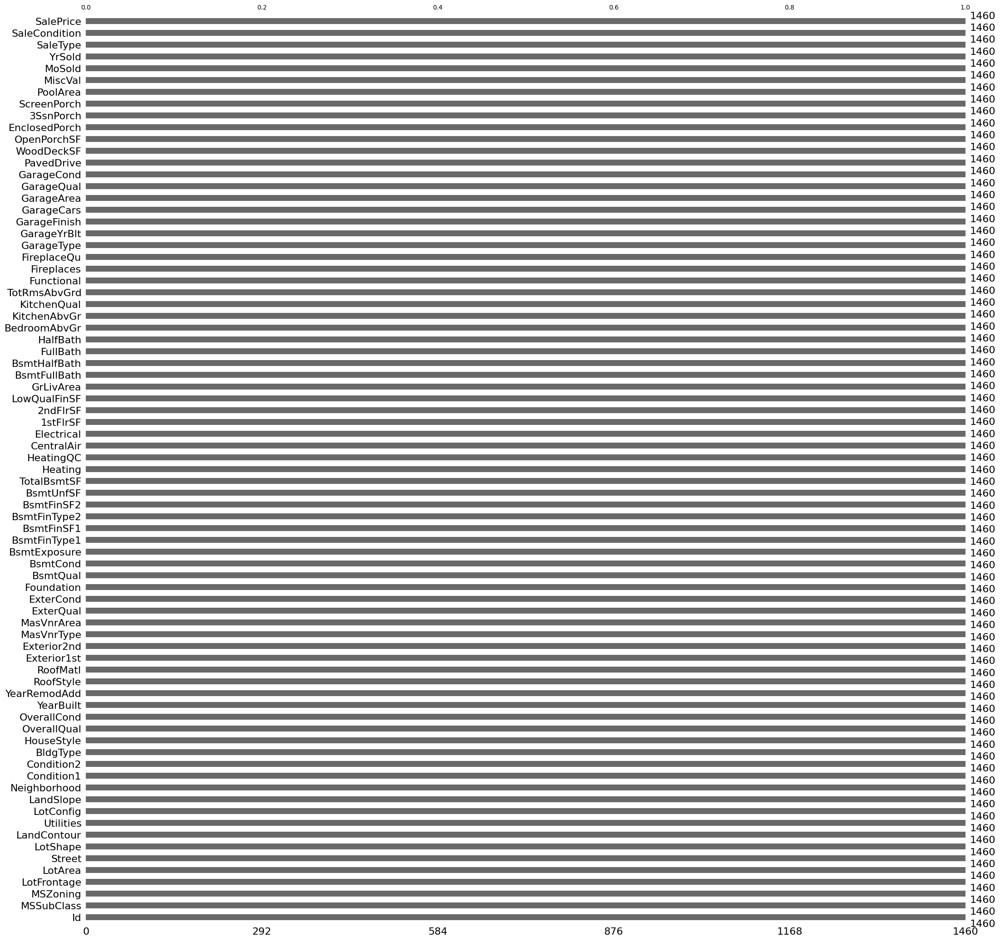

In [20]:
msno.bar(df_clean)
plt.show()

In [21]:
# Now, no null value is present into the dataset

In [22]:
# Drop the Id column as it is not useful for analysis
df_clean = df_clean.drop(['Id'], axis=1)
df_clean.shape

(1460, 76)

#### Data visulation

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64


<AxesSubplot: xlabel='SalePrice', ylabel='Density'>

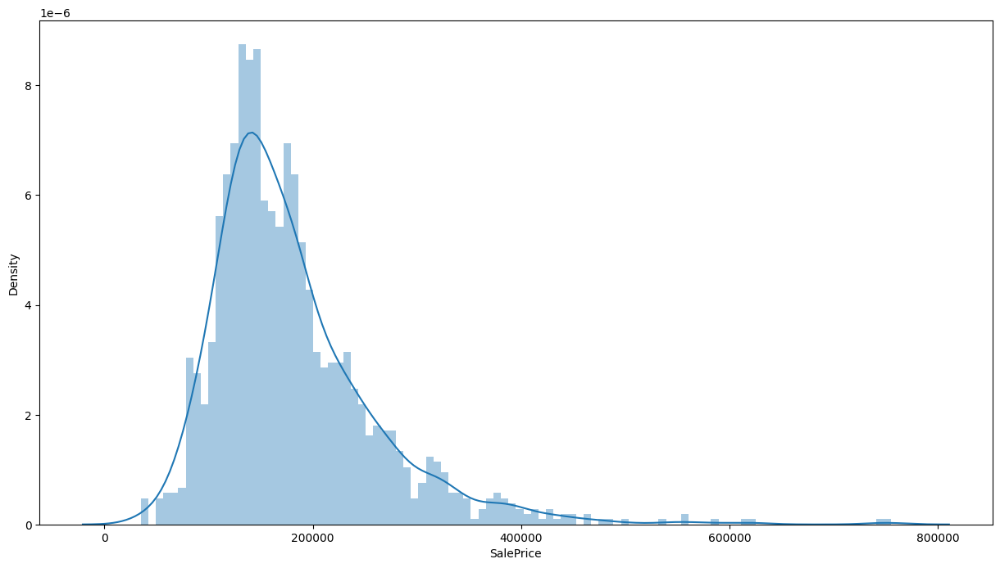

In [23]:
# Let's plot target variable distribution

print(df_clean['SalePrice'].describe())

plt.figure(figsize=(15, 8))
sns.distplot(df_clean['SalePrice'], bins=100)

In [24]:
# SalePrice is skewed to the right and there are outliers present after 0.5 million

print(f"There are {df_clean[df_clean['SalePrice'] > 500000].shape[0]} extreme records in the dataset")

print('\n')

df_clean[df_clean['SalePrice'] > 500000]




There are 9 extreme records in the dataset




,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
178,20,RL,63.0,17423,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2008,2009,Hip,CompShg,VinylSd,VinylSd,Stone,748.0,Ex,TA,PConc,Ex,TA,No,GLQ,1904,Unf,0,312,2216,GasA,Ex,Y,SBrkr,2234,0,0,2234,1,0,2,0,1,1,Ex,9,Typ,1,Gd,Attchd,2009.0,Fin,3,1166,TA,TA,Y,0,60,0,0,0,0,0,7,2009,New,Partial,501837
440,20,RL,105.0,15431,Pave,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,10,5,2008,2008,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,1767,ALQ,539,788,3094,GasA,Ex,Y,SBrkr,2402,0,0,2402,1,0,2,0,2,1,Ex,10,Typ,2,Gd,Attchd,2008.0,Fin,3,672,TA,TA,Y,0,72,0,0,170,0,0,4,2009,WD,Normal,555000
691,60,RL,104.0,21535,Pave,IR1,Lvl,AllPub,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10,6,1994,1995,Gable,WdShngl,HdBoard,HdBoard,BrkFace,1170.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,1455,Unf,0,989,2444,GasA,Ex,Y,SBrkr,2444,1872,0,4316,0,1,3,1,4,1,Ex,10,Typ,2,Ex,Attchd,1994.0,Fin,3,832,TA,TA,Y,382,50,0,0,0,0,0,1,2007,WD,Normal,755000
769,60,RL,47.0,53504,Pave,IR2,HLS,AllPub,CulDSac,Mod,StoneBr,Norm,Norm,1Fam,2Story,8,5,2003,2003,Hip,CompShg,CemntBd,Wd Shng,BrkFace,603.0,Ex,TA,PConc,Gd,TA,Gd,ALQ,1416,Unf,0,234,1650,GasA,Ex,Y,SBrkr,1690,1589,0,3279,1,0,3,1,4,1,Ex,12,Mod,1,Gd,BuiltIn,2003.0,Fin,3,841,TA,TA,Y,503,36,0,0,210,0,0,6,2010,WD,Normal,538000
803,60,RL,107.0,13891,Pave,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,2Story,9,5,2008,2009,Hip,CompShg,VinylSd,VinylSd,Stone,424.0,Ex,TA,PConc,Ex,TA,Gd,Unf,0,Unf,0,1734,1734,GasA,Ex,Y,SBrkr,1734,1088,0,2822,0,0,3,1,4,1,Ex,12,Typ,1,Gd,BuiltIn,2009.0,RFn,3,1020,TA,TA,Y,52,170,0,0,192,0,0,1,2009,New,Partial,582933
898,20,RL,100.0,12919,Pave,IR1,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,9,5,2009,2010,Hip,CompShg,VinylSd,VinylSd,Stone,760.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,2188,Unf,0,142,2330,GasA,Ex,Y,SBrkr,2364,0,0,2364,1,0,2,1,2,1,Ex,11,Typ,2,Gd,Attchd,2009.0,Fin,3,820,TA,TA,Y,0,67,0,0,0,0,0,3,2010,New,Partial,611657
1046,60,RL,85.0,16056,Pave,IR1,Lvl,AllPub,Inside,Gtl,StoneBr,Norm,Norm,1Fam,2Story,9,5,2005,2006,Hip,CompShg,CemntBd,CmentBd,Stone,208.0,Gd,TA,PConc,Ex,TA,Av,GLQ,240,Unf,0,1752,1992,GasA,Ex,Y,SBrkr,1992,876,0,2868,0,0,3,1,4,1,Ex,11,Typ,1,Gd,BuiltIn,2005.0,Fin,3,716,TA,TA,Y,214,108,0,0,0,0,0,7,2006,New,Partial,556581
1169,60,RL,118.0,35760,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10,5,1995,1996,Hip,CompShg,HdBoard,HdBoard,BrkFace,1378.0,Gd,Gd,PConc,Ex,TA,Gd,GLQ,1387,Unf,0,543,1930,GasA,Ex,Y,SBrkr,1831,1796,0,3627,1,0,3,1,4,1,Gd,10,Typ,1,TA,Attchd,1995.0,Fin,3,807,TA,TA,Y,361,76,0,0,0,0,0,7,2006,WD,Normal,625000
1182,60,RL,160.0,15623,Pave,IR1,Lvl,AllPub,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10,5,1996,1996,Hip,CompShg,Wd Sdng,ImStucc,None,0.0,Gd,TA,PConc,Ex,TA,Av,GLQ,2096,Unf,0,300,2396,GasA,Ex,Y,SBrkr,2411,2065,0,4476,1,0,3,1,4,1,Ex,10,Typ,2,TA,Attchd,1996.0,Fin,3,813,TA,TA,Y,171,78,0,0,0,555,0,7,2007,WD,Abnorml,745000


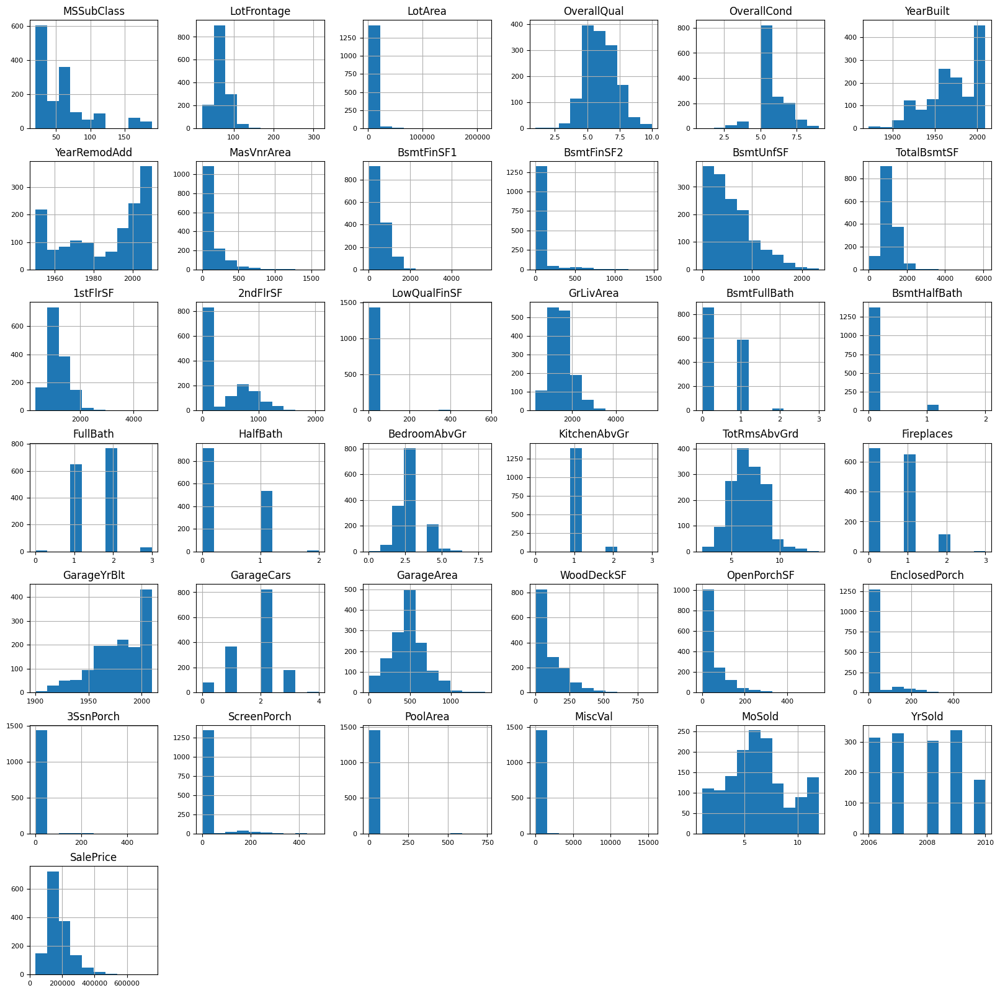

In [25]:
# let's plot histgram chart for all the numeric variables

df_clean.hist(figsize=(20, 20), xlabelsize=8, ylabelsize=8)
plt.show()

Observation:

    1stFlrSF has similar distribution like SalePrice.

In [26]:
df_nuneric = df_clean.select_dtypes(include=['int','float'])
print(df_nuneric.shape)

print(f'Total numeric columns count is {df_nuneric.shape[1]}')

# So, there is no categorical column type needs to be change as numeric

(1460, 37)
Total numeric columns count is 37


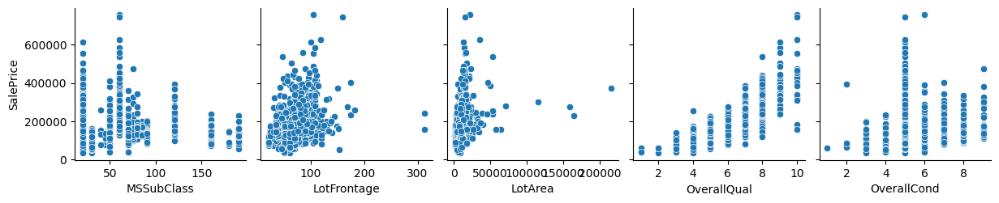

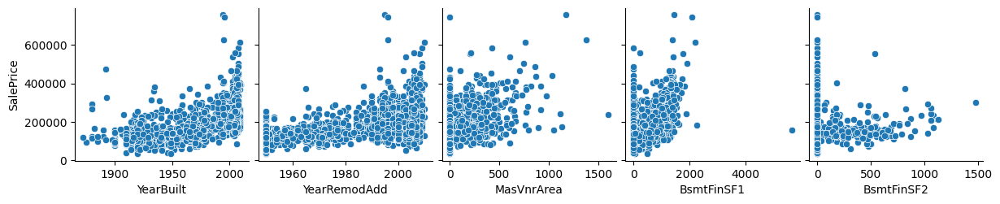

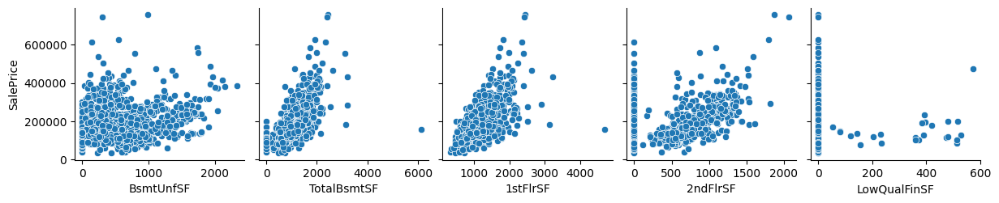

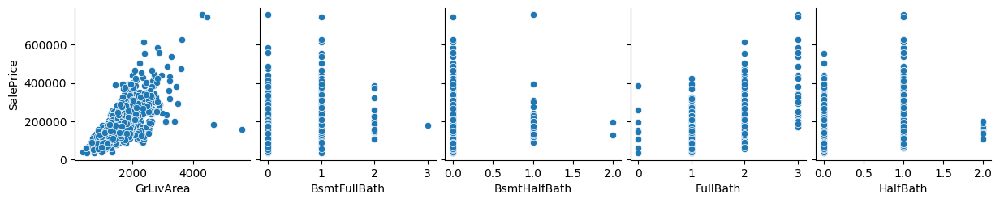

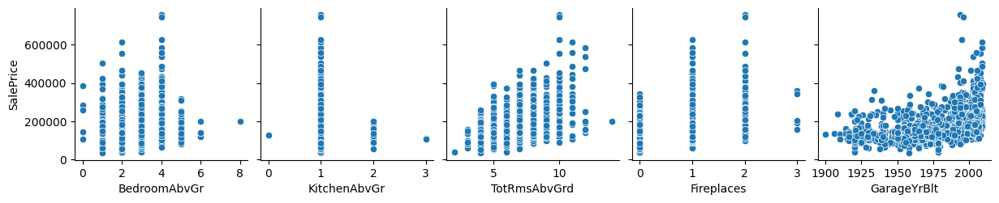

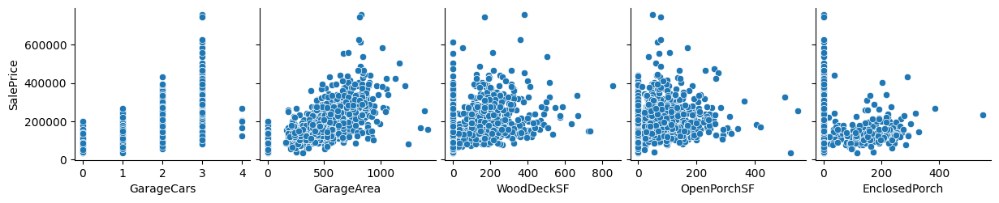

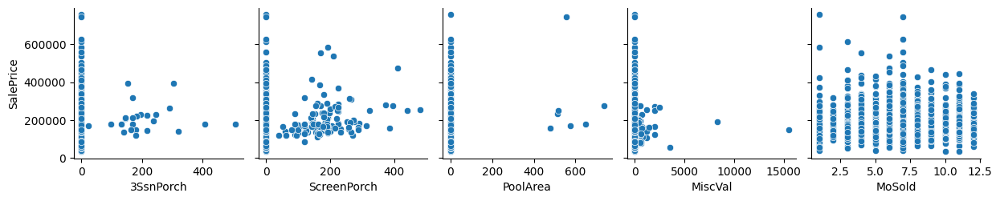

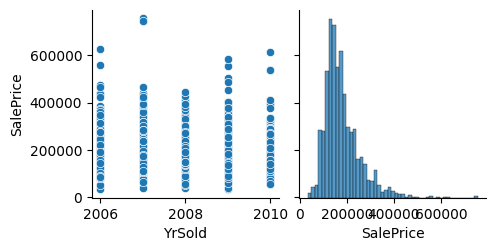

In [27]:
# let's make pair plot for all numeric variable with trarget variable SalePrice
for i in range(0, len(df_nuneric.columns), 5):
    sns.pairplot(data=df_nuneric,
                 x_vars=df_nuneric.columns[i:i+5],
                 y_vars=['SalePrice'])


Observation:

    Many variables like 'LotFrontage', 'LotArea', '1stFlrSF' etc. showing linear relationship with SalePrice.
    There is no liner relationship present for the variables like 'FullBath', 'HalfBath' etc.

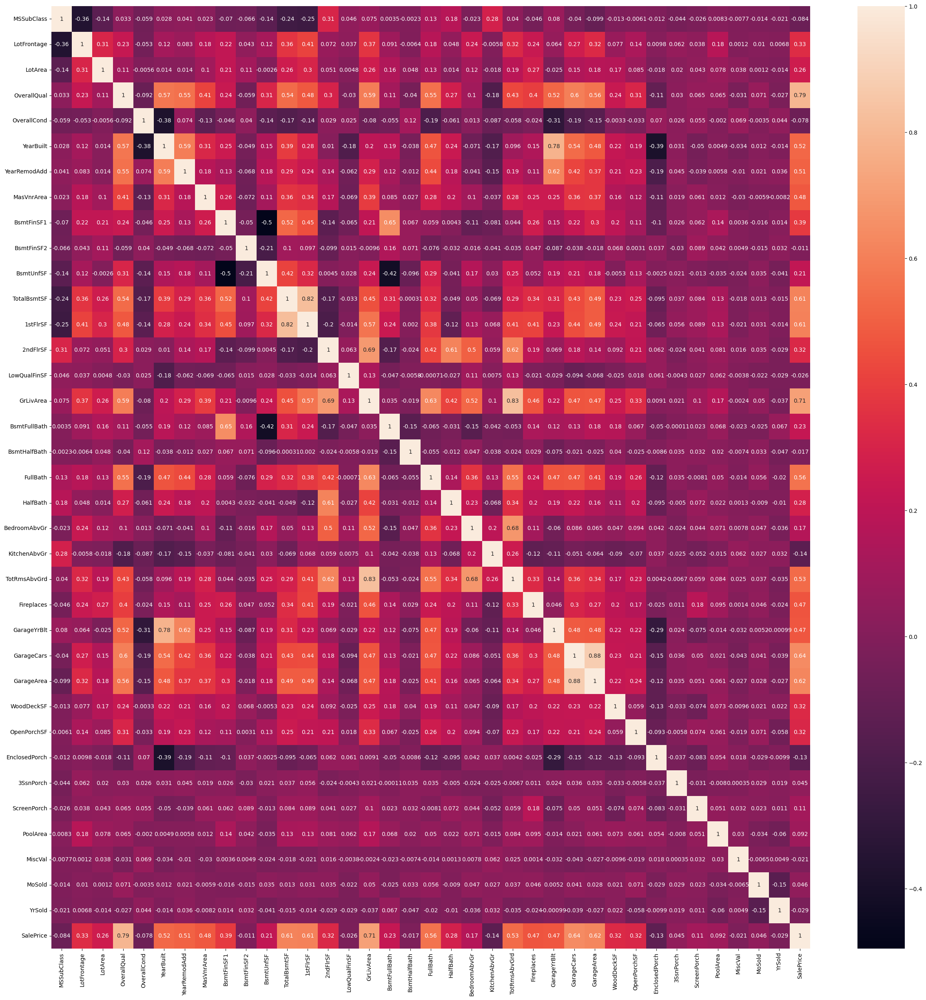

In [28]:
# Let check correlation of numeric variable with SalePrice with the help of heatmap

plt.figure(figsize=(30,30))

sns.heatmap(df_nuneric.corr(), annot=True)
plt.show()

Observations:
Following variable are highly correlated with target variable ( > 0.6)

- OverallQual    0.79
- GrLivArea      0.71
- GarageCars     0.64
- GarageArea     0.62
- TotalBsmtSF    0.61
- 1stFlrSF       0.61

In [29]:
# Let's visualise the categorical variables with SalePrice using box and bar plot

df_categorical = df_clean.select_dtypes(include=['object'])
print(df_categorical.shape)
df_categorical.head()

(1460, 39)


,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal


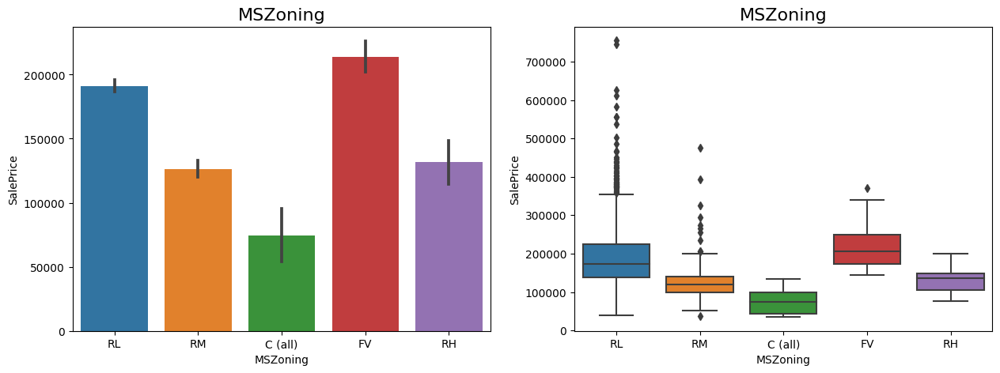

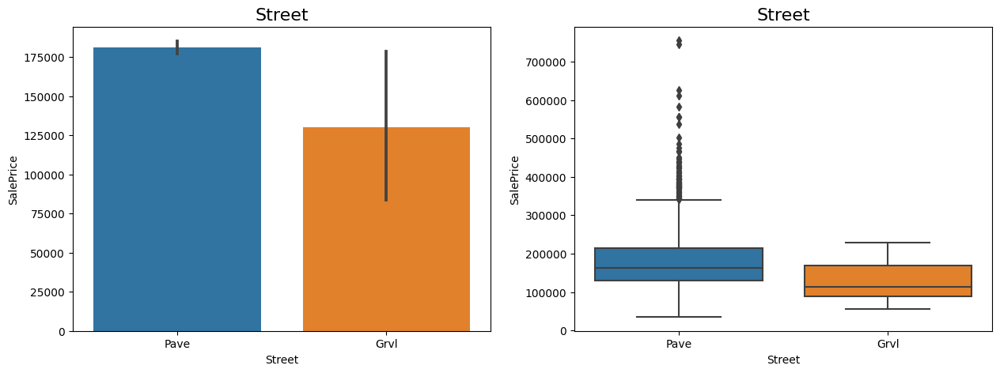

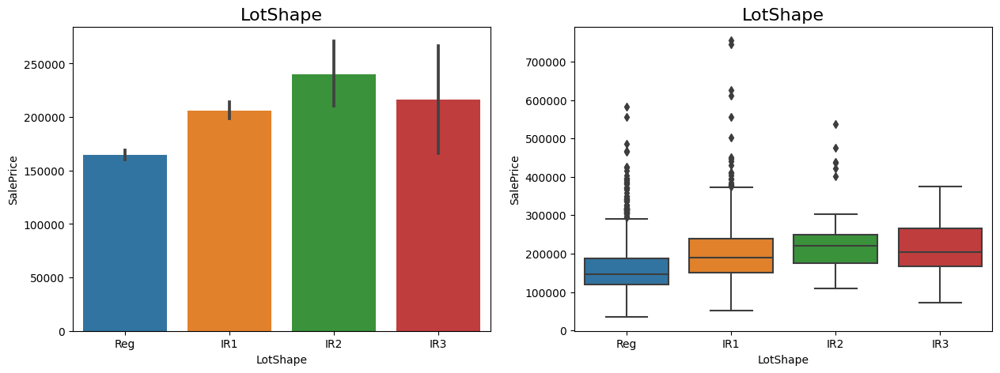

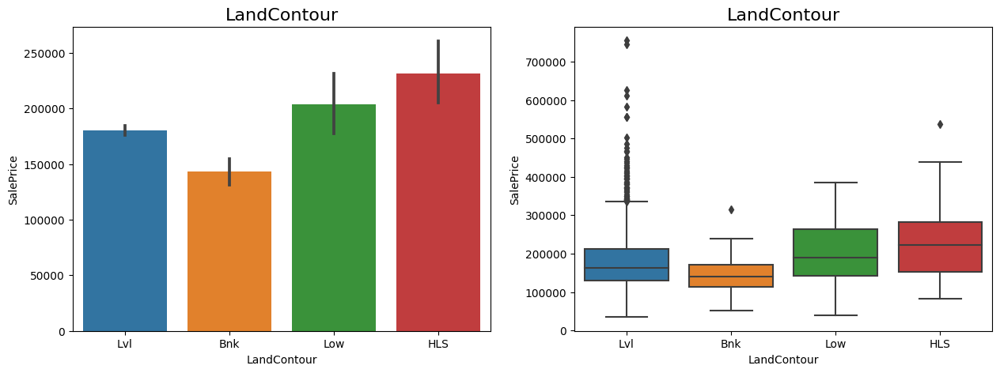

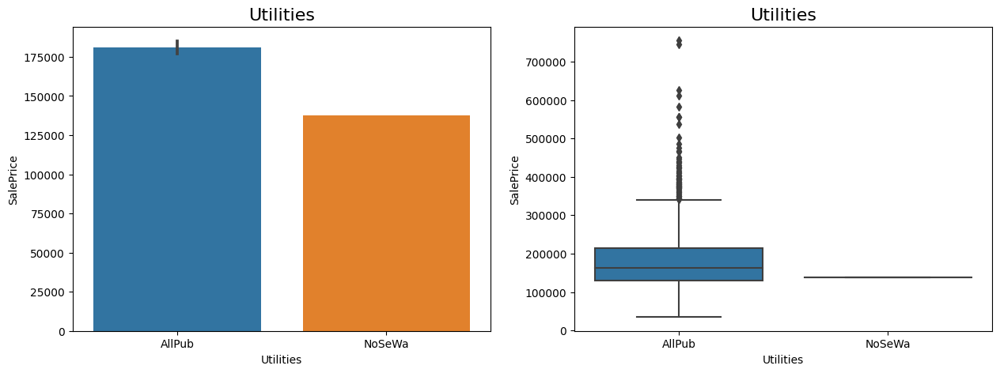

...

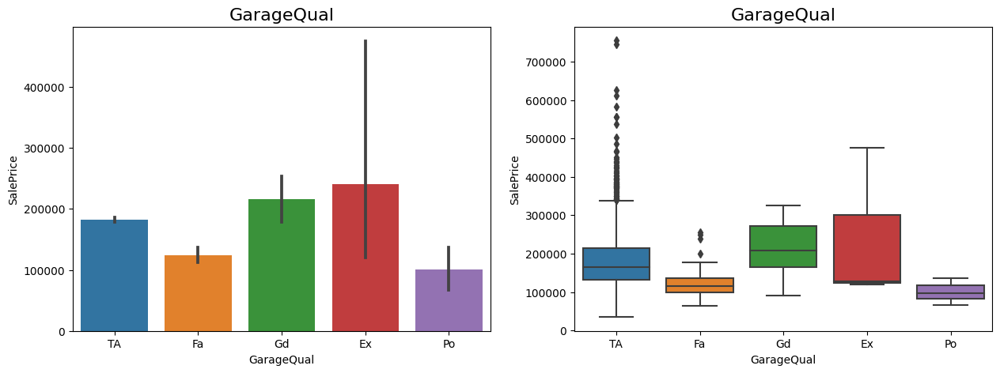

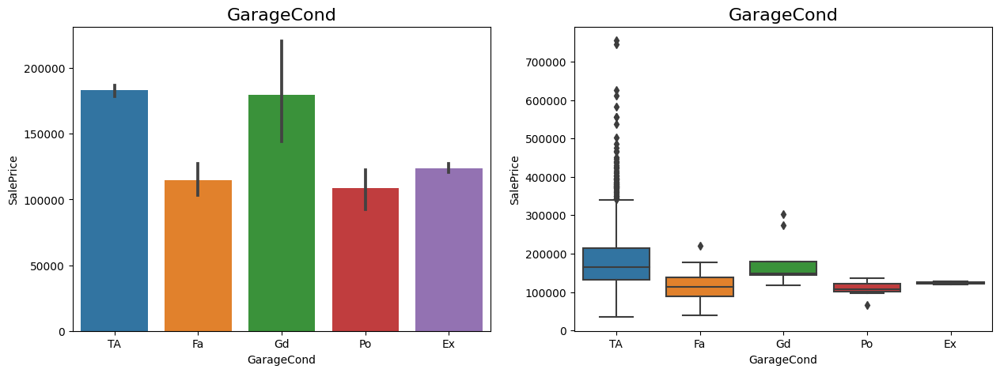

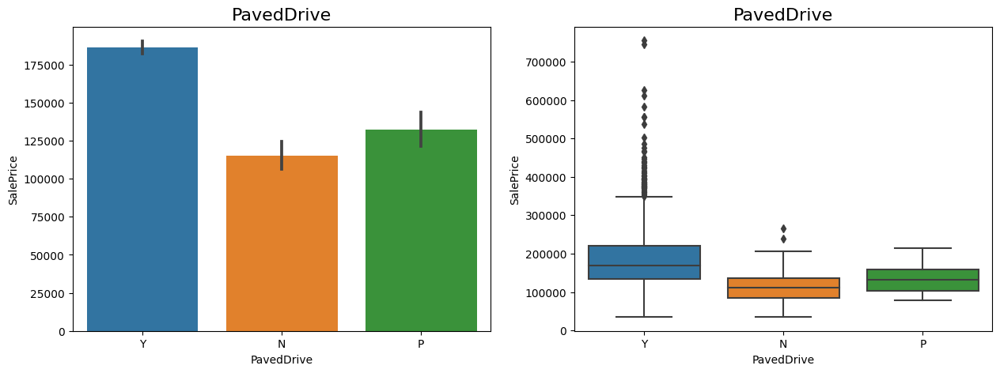

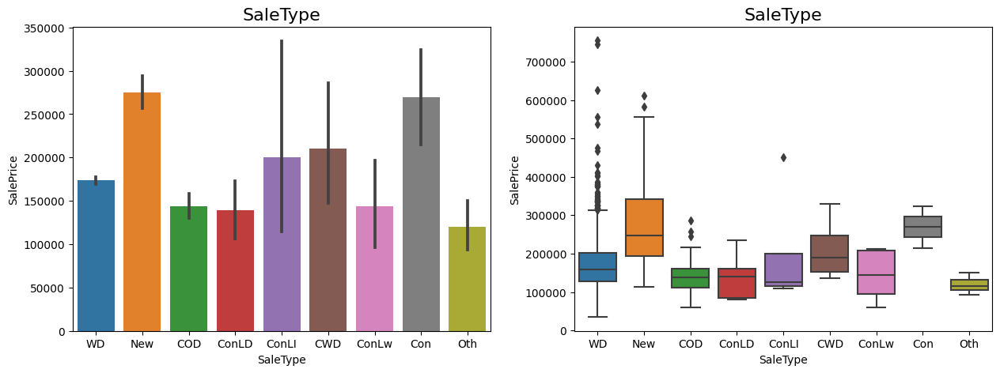

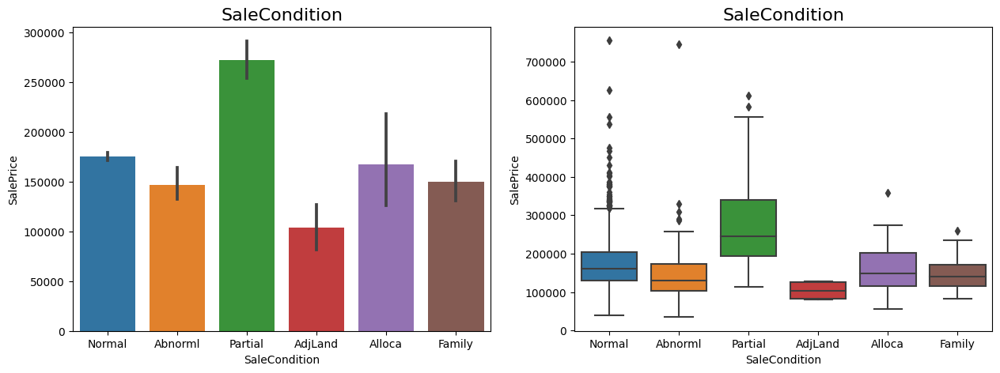

In [30]:
# Plot the graph for bar and box

def plot_bar_and_box_plot(col_name):
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 2, 1)
    plt.title(col_name, fontdict={'fontsize': 16})
    sns.barplot(data = df_clean, x=df_clean[col_name], y=df_clean['SalePrice'])

    plt.subplot(1, 2, 2)
    plt.title(col_name, fontdict={'fontsize': 16})
    sns.boxplot(data = df_clean, x=df_clean[col_name], y=df_clean['SalePrice'])
    plt.show()


for col in df_categorical.columns:
  plot_bar_and_box_plot(col)


Observations:

-    MSZoning - SalePrice is high for FV and low for C(all)   
-    Street - SalePrice is high at Pave and low at Grvl   
-    HuseStyle - SalePrice is high for 2Story and 2.5Fin	   
-    RoofStyle - SalePrice is high for Shed, Hip and low for Gambrel

#### Outlier detection and treatment

In [31]:
df_clean.describe(percentiles=[0.25, 0.5, 0.75, 1])

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,22.024023,9981.264932,1.382997,1.112799,30.202904,20.645407,180.569112,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,23.994583,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,60.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1962.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,70.049958,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1978.506164,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,79.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
100%,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [32]:
numeric_columns = df_nuneric.columns.tolist()
print(len(numeric_columns))

37


<AxesSubplot: >

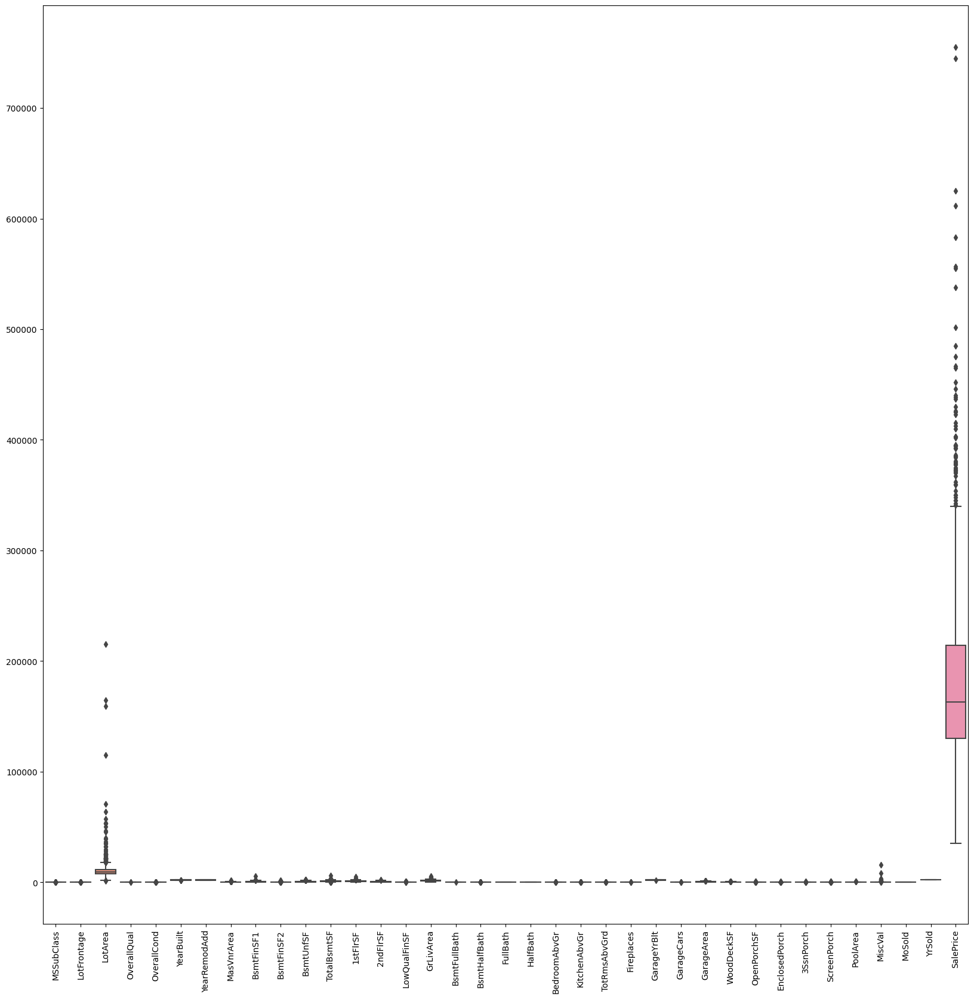

In [33]:
# Let's find the out outliers for numeric columns using box plot

plt.figure(figsize=(20, 20))
plt.xticks(rotation=90)
sns.boxplot(data=df_clean[numeric_columns])


In [34]:
print(df_clean.shape)

(1460, 76)


In [35]:
# let's remove the outliers
Q1 = df_clean.quantile(0.05)
Q3 = df_clean.quantile(0.98)
IQR = Q3 - Q1
df_clean = df_clean[~((df_clean[numeric_columns] < (Q1 - 1.5 * IQR)) |(df_clean[numeric_columns] > (Q3 + 1.5 * IQR))).any(axis=1)]
print(df_clean.shape)

(1389, 76)


In [36]:
print(df_clean.shape)

(1389, 76)


<AxesSubplot: >

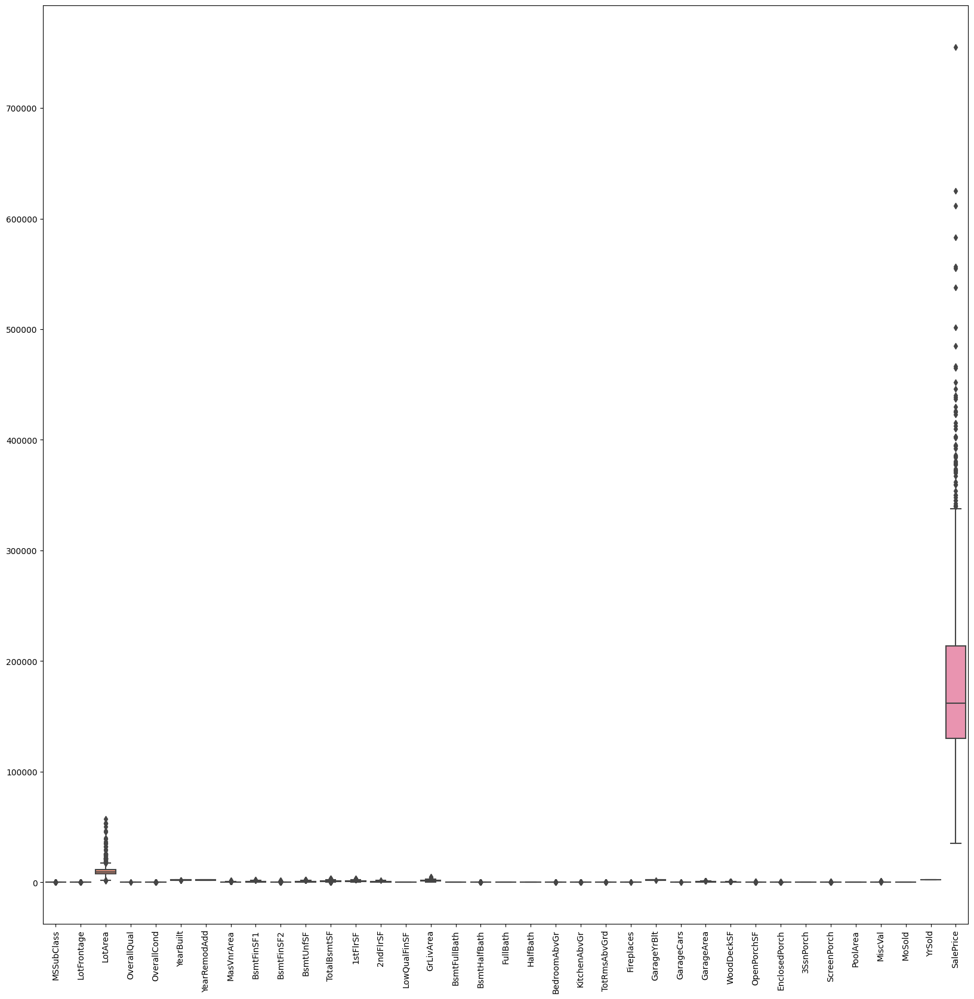

In [37]:
plt.figure(figsize=(20, 20))
plt.xticks(rotation=90)
sns.boxplot(data=df_clean[numeric_columns])

In [38]:
# Outliers are removed

## Data preparation

In [39]:
df_clean.shape

(1389, 76)

In [40]:
# Let's create derived column HouseAge
# df_clean['HouseAge'] = (df_clean['YrSold'] - df_clean['YearBuilt'])

In [41]:
# Drop the columns YrSold and YearBuilt
df_clean = df_clean.drop(['YrSold', 'YearBuilt'], axis = 1)

In [42]:
df_clean.shape

(1389, 74)

#### Dummy variable Creation

In [43]:
# List the categorical variables
df_categorical = df_clean.select_dtypes(include=['object'])
categorical_columns = df_categorical.columns.tolist()
print(f"We have {len(categorical_columns)} categorical columns")

We have 39 categorical columns


In [44]:
# Let's create n-1 dummy variables for the categorical columns using drop_first
categorical_dummies = pd.get_dummies(df_clean[categorical_columns], drop_first=True)

categorical_dummies.head()

,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Membran,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
1,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1

In [45]:
# Now all the columns are numeric

In [46]:
# Let see the shape of categorical_dummies
print(categorical_dummies.shape)

# Concatnate the dummies with original dataset
df_clean = pd.concat([df_clean, categorical_dummies], axis=1)


# Let see the shape of df_clean
print(df_clean.shape)

# Drop the original columns after creating dummies
df_clean.drop(categorical_columns, axis=1, inplace=True)

# Let see the shape of df_clean
print(df_clean.shape)

(1389, 197)
(1389, 271)
(1389, 232)


#### Train - Test split

In [47]:
df_train, df_test = train_test_split(df_clean, train_size=0.7, test_size=0.3, random_state=100)

#### ReScaling the features

In [48]:
# Create a list of numeric columns

numeric_cols = df_clean.select_dtypes(include=['int','float']).columns

In [49]:
# As we know scaling doesn't impact our model. So, let's scale the numeric columns to have comparable scale.

# Create a scaling object or normalisation
scaler = StandardScaler() 

# Scale train dataset using 'fit_transform'
df_train[numeric_cols]= scaler.fit_transform(df_train[numeric_cols])


In [50]:
# Scale test dataset using 'transform'
df_test[numeric_cols] = scaler.transform(df_test[numeric_cols])

#### Split into X (InDependent) and y (Dependent)

In [51]:
df_train.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Membran,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
1285,-0.163345,-1.011130,-0.761381,-0.067640,0.382212,-1.667914,-0.577923,-1.018865,-0.287503,0.499990,-0.640796,-0.881109,0.554890,0.0,-0.188051,-0.846469,-0.233055,-1.034529,-0.760660,1.444326,-0.206372,-0.313553,0.589600,-1.598119,-1.053498,-0.922539,-0.381240,-0.698080,-0.371161,0.0,-0.265393,0.0,-0.146007,-0.478151,-0.6

In [52]:
# Let's create X_train and y_train
y_train = df_train.pop('SalePrice')
X_train = df_train

In [53]:
# Let's create X_test and y_test
y_test = df_test.pop('SalePrice')
X_test = df_test

In [54]:
# Scaling is done

## Model building and evaluation

#### Liner Regression model

In [55]:
lm = LinearRegression()

# Fit a line using x_train and y_train to lm object
lm.fit(X_train, y_train)

LinearRegression()

In [56]:
# Let's print the coefficients and intercept
print(lm.intercept_)
print(lm.coef_)

-0.858928996433385
[-6.22625383e-02 -6.09858515e-03  4.65019974e-02  1.31264373e-01
  7.65198634e-02  3.27466647e-02  8.42960833e-02  1.14734196e+11
  4.36517385e+10  1.15540580e+11 -1.11860057e+11  2.50755977e+11
  2.85747070e+11  2.45915924e+11 -3.31745488e+11  4.12818364e-03
 -1.04342322e-03  2.19021877e-02 -1.87519062e-03 -6.19998145e-02
 -4.91493890e-02  5.34035487e-02  4.23028402e-02  1.36553260e-03
  4.68852448e-02  3.71803242e-02  1.24034128e-02 -7.18766233e-03
  1.59610782e-02  3.91167888e+10  1.45880466e-02 -4.20902745e+10
  4.62411750e-03 -2.12554932e-02  2.48977661e-01  2.89913177e-01
  3.77792358e-01  3.46694946e-01  2.45094299e-02  5.24635315e-02
  1.59058571e-01  2.26612091e-02  2.04689026e-01 -5.63659668e-02
  1.15615845e-01 -6.69630051e-01  8.96835327e-02 -6.94999695e-02
 -8.62808228e-02 -9.03224945e-03  5.29861450e-02 -2.88028717e-01
 -2.17075348e-02 -1.30233765e-02 -1.18057251e-01 -8.99162292e-02
 -1.77001953e-02  2.93731689e-02 -2.81661987e-01 -6.82678223e-02
 -2.61

In [57]:
# running RFE on training set

rfe = RFE(lm, n_features_to_select=20)
rfe = rfe.fit(X_train, y_train)
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('MSSubClass', False, 84),
 ('LotFrontage', False, 198),
 ('LotArea', False, 142),
 ('OverallQual', False, 45),
 ('OverallCond', False, 111),
 ('YearRemodAdd', False, 173),
 ('MasVnrArea', False, 114),
 ('BsmtFinSF1', True, 1),
 ('BsmtFinSF2', True, 1),
 ('BsmtUnfSF', True, 1),
 ('TotalBsmtSF', True, 1),
 ('1stFlrSF', False, 9),
 ('2ndFlrSF', False, 8),
 ('LowQualFinSF', False, 15),
 ('GrLivArea', False, 2),
 ('BsmtFullBath', False, 202),
 ('BsmtHalfBath', False, 211),
 ('FullBath', False, 180),
 ('HalfBath', False, 208),
 ('BedroomAbvGr', False, 135),
 ('KitchenAbvGr', False, 153),
 ('TotRmsAbvGrd', False, 145),
 ('Fireplaces', False, 162),
 ('GarageYrBlt', False, 209),
 ('GarageCars', False, 118),
 ('GarageArea', False, 164),
 ('WoodDeckSF', False, 194),
 ('OpenPorchSF', False, 196),
 ('EnclosedPorch', False, 187),
 ('3SsnPorch', False, 16),
 ('ScreenPorch', False, 191),
 ('PoolArea', False, 18),
 ('MiscVal', False, 201),
 ('MoSold', False, 176),
 ('MSZoning_FV', False, 31),
 ('MSZo

In [58]:
# Extracting the high significants columns
col = list(X_train.columns[rfe.support_])
col

['BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'Condition2_PosN',
 'Condition2_RRAn',
 'RoofMatl_Membran',
 'RoofMatl_WdShngl',
 'Exterior1st_BrkComm',
 'Exterior1st_Stone',
 'ExterQual_Fa',
 'ExterQual_Gd',
 'ExterQual_TA',
 'BsmtQual_Fa',
 'BsmtQual_Gd',
 'BsmtQual_TA',
 'Functional_Sev',
 'SaleType_Con',
 'SaleType_New',
 'SaleCondition_Partial']

In [59]:
# Let's check the list of insignificant columns
list(X_train.columns[~rfe.support_])

['MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearRemodAdd',
 'MasVnrArea',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Pave',
 'LotShape_IR2',
 'LotShape_IR3',
 'LotShape_Reg',
 'LandContour_HLS',
 'LandContour_Low',
 'LandContour_Lvl',
 'Utilities_NoSeWa',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 'LandSlope_Mod',
 'LandSlope_Sev',
 'Neighborhood_Blueste',
 'Neighborhood_BrDale',
 'Neighborhood_BrkSide',
 'Neighborhood_ClearCr',
 'Neighborhood_CollgCr',
 'Neighborhood_Crawfor',
 'Neighborhood_Edwards',
 'Neighborhood_Gilbert',
 'Neighborhood_IDOTRR',

In [60]:
# Let's predict the value

y_pred_train = lm.predict(X_train)
y_pred_test = lm.predict(X_test)


In [61]:
def show_metrics(y_train, y_pred_train, y_test, y_pred_test):
    # Let's see the values of the r2_score, RSS and MSE and create a list of it
    lr_r2_mse_list = []

    # R-Squared of train and test data
    lr_r2_score_train = r2_score(y_train, y_pred_train)
    print(f"R-Squared for train set is : {lr_r2_score_train}")
    lr_r2_mse_list.append(lr_r2_score_train)

    lr_r2_score_test = r2_score(y_test, y_pred_test)
    print(f"R-Squared for test set is : {lr_r2_score_test}")
    lr_r2_mse_list.append(lr_r2_score_test)

    # Residual sum of squares of train and test data
    lr_rss_train = np.sum(np.square(y_train - y_pred_train))
    print(f"Residual sum of squares of train set is : {lr_rss_train}")
    lr_r2_mse_list.append(lr_rss_train)

    lr_rss_test = np.sum(np.square(y_test - y_pred_test))
    print(f"Residual sum of squares of test set is : {lr_rss_test}")
    lr_r2_mse_list.append(lr_rss_test)

    # Mean squared error of train and test data
    lr_mse_train = mean_squared_error(y_train, y_pred_train)
    print(f"Mean Squared Error of train set is : {lr_mse_train}")
    lr_r2_mse_list.append(lr_mse_train)

    lr_mse_test = mean_squared_error(y_test, y_pred_test)
    print(f"Mean Squared Error of test set is : {lr_mse_test}")
    lr_r2_mse_list.append(lr_mse_test)

    # Root mean squared error of train and test data
    lr_rmse_train = lr_mse_train**0.5
    print(f"Root Mean Squared Error of train set is : {lr_rmse_train}")
    lr_r2_mse_list.append(lr_rmse_train)

    lr_rmse_test = lr_mse_test**0.5
    print(f"Root Mean Squared Error of test set is : {lr_rmse_test}")
    lr_r2_mse_list.append(lr_rmse_test)

    return lr_r2_mse_list

lr_metrics = show_metrics(y_train, y_pred_train, y_test, y_pred_test)

R-Squared for train set is : 0.9355932704763199
R-Squared for test set is : -587953936514655.1
Residual sum of squares of train set is : 62.603341097017065
Residual sum of squares of test set is : 2.6265268358934995e+17
Mean Squared Error of train set is : 0.06440672952368011
Mean Squared Error of test set is : 629862550573980.8
Root Mean Squared Error of train set is : 0.25378480948173415
Root Mean Squared Error of test set is : 25097062.588557664


In [62]:
# Observation - We can clearly see that model is not performing well with unseen data

# Let's solve this problem using Regularization (Ridge and Lasso Regression model)

#### Ridge Regression model

In [63]:
# Create a list of alpha to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0,
                    2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]}


# If value too high, it will lead to underfitting
# If it is too low, it will not handle the overfitting

ridge = Ridge()

# Let's run a cross validation on a list of alphas to find the optimum value of alpha
ridge_cv = GridSearchCV(estimator=ridge,
                       param_grid=params,
                       scoring='neg_mean_absolute_error',
                       cv=5,
                       return_train_score=True,
                       verbose=1, n_jobs=-1)
ridge_cv.fit(X_train, y_train)





Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(), n_jobs=-1,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [64]:
# Let's see the optimal value of alpha
ridge_cv.best_params_

{'alpha': 10.0}

In [65]:
# Let's build the Ridge Regression model using alpha optimum value 10
ridge = Ridge(alpha=10)

# Fit the model on training dataset
ridge.fit(X_train, y_train)

Ridge(alpha=10)

In [66]:
# Let's see the coefficients of ridge regression fitted model
ridge.coef_

array([-5.84975645e-02, -1.53883522e-03,  3.39598754e-02,  1.79387095e-01,
        7.34792362e-02,  3.52031279e-02,  9.45687517e-02,  9.39830394e-02,
        1.36827579e-02, -1.02361519e-02,  9.11643891e-02,  7.18297714e-02,
        1.34659380e-01,  0.00000000e+00,  1.70281948e-01,  9.04951521e-03,
       -1.25456688e-03,  3.40531163e-02,  1.57556415e-02, -5.35835803e-02,
       -4.76297644e-02,  7.60635271e-02,  4.85320830e-02,  1.40074412e-02,
        5.33019949e-02,  2.66020944e-02,  2.49792961e-02, -7.57660243e-03,
        7.00772944e-03,  0.00000000e+00,  1.29685157e-02,  0.00000000e+00,
        2.82741460e-03, -2.28394277e-02,  4.64053713e-02,  1.32599362e-02,
        1.12335003e-01, -4.09673001e-03,  4.90365405e-02,  7.75351869e-02,
        4.34230972e-02,  1.81414262e-02,  1.66012035e-01, -4.69112478e-02,
        1.00339456e-01, -4.55339862e-02,  8.42993178e-02, -7.05586607e-02,
       -2.58180811e-02, -2.37273376e-02,  5.12258934e-02, -7.34936697e-02,
       -1.61966986e-03,  

In [67]:
## Make predictions
y_train_pred = ridge.predict(X_train)
y_pred = ridge.predict(X_test)

In [68]:
# Let's print the score metrics
ridge_metrics = show_metrics(y_train, y_train_pred, y_test, y_pred)

R-Squared for train set is : 0.917088469112303
R-Squared for test set is : 0.898953240945611
Residual sum of squares of train set is : 80.59000802284149
Residual sum of squares of test set is : 45.139934925803715
Mean Squared Error of train set is : 0.08291153088769701
Mean Squared Error of test set is : 0.10824924442638781
Root Mean Squared Error of train set is : 0.2879436244956589
Root Mean Squared Error of test set is : 0.3290125292848098


Observation: 

    - Model is performing well after regularziation

In [69]:
# Now we see the changes in coefficients after regularization

# Create a dataframe of ridge cross validation results
ridge_cv_results= pd.DataFrame(ridge_cv.cv_results_)
ridge_cv_results




,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.045428,0.014607,0.006209,0.000392,0.0001,{'alpha': 0.0001},-0.256265,-0.245993,-0.269511,-0.245747,-0.212394,-0.245982,0.018908,27,-0.153652,-0.164130,-0.151563,-0.156393,-0.165895,-0.158327,0.005698
1,0.042402,0.016492,0.007681,0.001298,0.001,{'alpha': 0.001},-0.256108,-0.245911,-0.269467,-0.245819,-0.212208,-0.245903,0.018946,26,-0.153657,-0.164147,-0.151570,-0.156390,-0.165909,-0.158335,0.005702
2,0.027813,0.000746,0.009269,0.001801,0.01,{'alpha': 0.01},-0.254898,-0.245075,-0.269496,-0.246387,-0.210600,-0.245291,0.019406,25,-0.153709,-0.164316,-0.151633,-0.156365,-0.166044,-0.158414,0.005751
3,0.031830,0.008188,0.007620,0.000912,0.05,{'alpha': 0.05},-0.251841,-0.241310,-0.269361,-0.247603,-0.206292,-0.243281,0.020708,24,-0.154133,-0.165005,-0.152001,-0.156476,-0.166483,-0.158820,0.005847
4,0.027311,0.000633,0.007916,0.001195,0.1,{'alpha': 0.1},-0.249027,-0.237209,-0.267482,-0.248095,-0.203305,-0.241024,0.021219,22,-0.154849,-0.165838,-0.152250,-0.156644,-0.166966,-0.159309,0.005968
5,0.033855,0.005809,0.007959,0.001106,0.2,{'alpha': 0.2},-0.245149,-0.231042,-0.263865,-0.248302,-0.200430,-0.237758,0.021381,21,-0.156470,-0.167295,-0.152532,-0.157124,-0.167745,-0.160233,0.006155
6,0.028029,0.001725,0.009239,0.003386,0.3,{'alpha': 0.3},-0.242214,-0.226549,-0.260961,-0.248150,-0.199415,-0.235458,0.021145,20,-0.158025,-0.168454,-0.152738,-0.157549,-0.168364,-0.161026,0.006306
7,0.030354,0.002700,0.007135,0.001354,0.4,{'alpha': 0.4},-0.239609,-0.223185,-0.258560,-0.247671,-0.198926,-0.233590,0.020822,19,-0.159379,-0.169470,-0.152994,-0.157962,-0.168889,-0.161739,0.006438
8,0.028476,0.000831,0.008183,0.001087,0.5,{'alpha': 0.5},-0.237332,-0.220537,-0.256546,-0.247082,-0.198698,-0.232039,0.020488,18,-0.160557,-0.170389,-0.153274,-0.158381,-0.169331,-0.162386,0.006553
9,0.028980,0.001750,0.008612,0.002147,0.6,{'alpha': 0.6},-0.235239,-0.218317,-0.254827,-0.246471,-0.198494,-0.230670,0.020209,17,-0.161647,-0.171168,-0.153540,-0.158780,-0.169722,-0.162972,0.006649


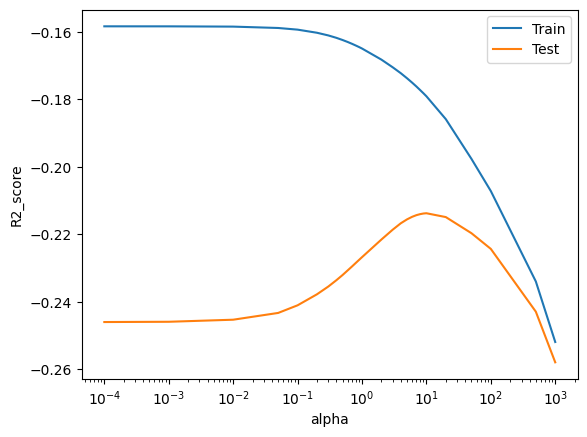

In [70]:
# Let's plot R2 Score against different values of alpha for both train and test dataset

plt.plot(ridge_cv_results['param_alpha'], ridge_cv_results['mean_train_score'], label='Train')
plt.plot(ridge_cv_results['param_alpha'], ridge_cv_results['mean_test_score'], label='Test')
plt.xlabel('alpha')
plt.ylabel('R2_score')
plt.xscale('log')
plt.legend()
plt.show()

Observation:

    - As the alpha value is increases the train error is decreasing and in test initial increases followed by decreases.

#### Lasso Regression model

In [71]:
# Let's create a Lasso regression model
lasso = Lasso()

# Let's run a cross validation on a list of alphas to find the optimum value of alpha

params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0,
                    2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]}

# Cross validation
lasso_cv = GridSearchCV(estimator=lasso,
                       param_grid=params,
                       scoring='neg_mean_absolute_error',
                       cv=5,
                       return_train_score=True,
                       verbose=1, n_jobs=-1)
lasso_cv.fit(X_train, y_train)


Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [72]:
# Let's the optimal value of alpha
lasso_cv.best_params_

{'alpha': 0.001}

In [73]:
# Let's create ridge regreesion model with optimum value of
lasso = Lasso(alpha=0.001)

In [74]:
# let's fit the model on training data
lasso.fit(X_train, y_train)

Lasso(alpha=0.001)

In [75]:
# Let's see the coefficients of lasso fitted model
lasso.coef_

array([-6.11473103e-02,  1.84349706e-03,  4.50261636e-02,  1.74366275e-01,
        7.05669499e-02,  3.78302270e-02,  9.34174124e-02,  1.05899075e-01,
        1.40554107e-02, -0.00000000e+00,  6.89446947e-02,  0.00000000e+00,
        2.07964278e-02,  0.00000000e+00,  3.05545371e-01,  4.58619630e-03,
        0.00000000e+00,  2.63345409e-02,  3.83617581e-03, -5.28391812e-02,
       -4.09715529e-02,  5.64184081e-02,  3.90905353e-02,  1.38899534e-02,
        3.81070025e-02,  3.35157450e-02,  2.00116027e-02, -3.06634002e-03,
        3.30280664e-03,  0.00000000e+00,  1.01813262e-02,  0.00000000e+00,
        1.58532376e-03, -2.22379157e-02,  0.00000000e+00,  0.00000000e+00,
        1.07528657e-01,  0.00000000e+00,  0.00000000e+00,  3.33925271e-02,
        0.00000000e+00,  1.68596266e-02,  1.83214014e-01, -0.00000000e+00,
        1.03466759e-01, -0.00000000e+00,  8.56672894e-02, -4.74019298e-02,
       -0.00000000e+00, -1.68496711e-03,  5.82159021e-03, -7.34836881e-02,
        0.00000000e+00,  

In [76]:
# Let's make predictions
y_train_pred = lasso.predict(X_train)
y_pred = lasso.predict(X_test)

In [77]:
# Let's print the metrics
lasso_metrics = show_metrics(y_train, y_train_pred, y_test, y_pred)

R-Squared for train set is : 0.9245107123940555
R-Squared for test set is : 0.9041004598285568
Residual sum of squares of train set is : 73.3755875529781
Residual sum of squares of test set is : 42.84055266357818
Mean Squared Error of train set is : 0.07548928760594455
Mean Squared Error of test set is : 0.10273513828196207
Root Mean Squared Error of train set is : 0.27475313939233625
Root Mean Squared Error of test set is : 0.32052322580736964


Observation: 

    - Model is performing well after regularziation as compare with Linear Regression

In [78]:
# Now we see the changes in coefficients after regularization

# Create a dataframe of lasso cross validation results
lasso_cv_results= pd.DataFrame(lasso_cv.cv_results_)
lasso_cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.112655,0.125340,0.010383,2.300548e-03,0.0001,{'alpha': 0.0001},-0.242342,-0.229904,-0.261242,-0.239901,-0.200027,-0.234683,0.020076,2,-0.155926,-0.167472,-0.153314,-0.157381,-0.168089,-0.160436,0.006139
1,0.670434,0.315405,0.010667,4.868379e-03,0.001,{'alpha': 0.001},-0.211403,-0.203622,-0.242909,-0.227008,-0.197391,-0.216467,0.016522,1,-0.174787,-0.182350,-0.168544,-0.172373,-0.181695,-0.175950,0.005347
2,0.069596,0.007027,0.011360,3.840894e-03,0.01,{'alpha': 0.01},-0.222992,-0.210028,-0.274546,-0.248807,-0.239952,-0.239265,0.022163,3,-0.230333,-0.231521,-0.217238,-0.225085,-0.227789,-0.226393,0.005085
3,0.043591,0.009711,0.009062,6.711135e-04,0.05,{'alpha': 0.05},-0.250239,-0.241068,-0.285520,-0.267446,-0.289500,-0.266755,0.018987,4,-0.262197,-0.268220,-0.251416,-0.260613,-0.256548,-0.259799,0.005624
4,0.047833,0.013048,0.014896,9.216790e-03,0.1,{'alpha': 0.1},-0.263021,-0.265977,-0.290122,-0.287856,-0.303977,-0.282191,0.015492,5,-0.280572,-0.286831,-0.268512,-0.280503,-0.273892,-0.278062,0.006289
5,0.037303,0.005902,0.014769,1.158274e-02,0.2,{'alpha': 0.2},-0.311420,-0.339018,-0.322476,-0.344518,-0.333780,-0.330243,0.011899,6,-0.328354,-0.331387,-0.320752,-0.336268,-0.325488,-0.328450,0.005249
6,0.039253,0.009383,0.009343,3.110223e-03,0.3,{'alpha': 0.3},-0.372656,-0.413198,-0.373579,-0.404228,-0.377850,-0.388302,0.016996,7,-0.386456,-0.385105,-0.377421,-0.399784,-0.386590,-0.387071,0.007200
7,0.030240,0.004312,0.009649,4.820042e-03,0.4,{'alpha': 0.4},-0.435842,-0.498211,-0.435917,-0.474436,-0.437811,-0.456444,0.025539,8,-0.451887,-0.450573,-0.446857,-0.473465,-0.454951,-0.455547,0.009328
8,0.032181,0.003094,0.009608,3.204990e-03,0.5,{'alpha': 0.5},-0.506883,-0.580705,-0.499431,-0.544817,-0.504639,-0.527295,0.031196,9,-0.522009,-0.518249,-0.521721,-0.544618,-0.523205,-0.525960,0.009474
9,0.051354,0.032411,0.011512,7.737251e-03,0.6,{'alpha': 0.6},-0.578603,-0.661390,-0.563286,-0.600210,-0.574894,-0.595677,0.034961,10,-0.592119,-0.587533,-0.596242,-0.606097,-0.594211,-0.595240,0.006149


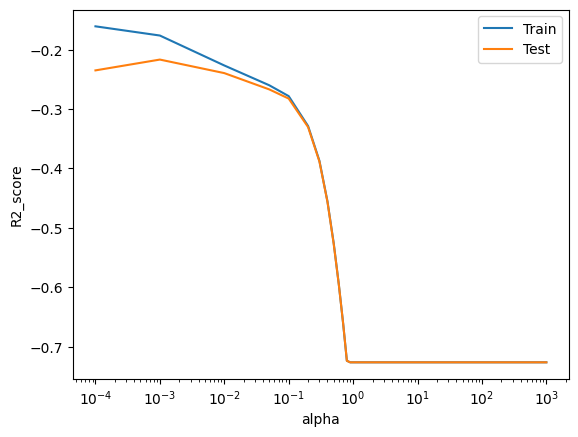

In [79]:
# Let's plot R2 Score against different values of alpha for both train and test dataset

plt.plot(lasso_cv_results['param_alpha'], lasso_cv_results['mean_train_score'], label='Train')
plt.plot(lasso_cv_results['param_alpha'], lasso_cv_results['mean_test_score'], label='Test')
plt.xlabel('alpha')
plt.ylabel('R2_score')
plt.xscale('log')
plt.legend()
plt.show()

Observation:

    - As the alpha value is increases the train and test error is decreasing and remain constant

Creating a table which contains the metrics for Linear, Ridge and Lasso

In [80]:
table = {
    'Metrics': ['R2 Score (Train)', 'R2 Score (Test)', 'RSS (Train)', 'RSS (Test)', 'MSE (Train)', 'MSE (Test)', 'RMSE (Train)', 'RMSE (Test)'],
    'Linear Regression': lr_metrics
}

lr_df = pd.DataFrame(table)

ridge_series = pd.Series(ridge_metrics, name = 'Ridge Regression')
lasso_series = pd.Series(lasso_metrics, name = 'Lasso Regression')

final_metrics = pd.concat([lr_df, ridge_series, lasso_series], axis=1)

final_metrics


,Metrics,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),9.355933e-01,0.917088,0.924511
1,R2 Score (Test),-5.879539e+14,0.898953,0.904100
2,RSS (Train),6.260334e+01,80.590008,73.375588
3,RSS (Test),2.626527e+17,45.139935,42.840553
4,MSE (Train),6.440673e-02,0.082912,0.075489
5,MSE (Test),6.298626e+14,0.108249,0.102735
6,RMSE (Train),2.537848e-01,0.287944,0.274753
7,RMSE (Test),2.509706e+07,0.329013,0.320523


#### Model Comparision

In [81]:
# Lets observe the changes in the coefficients after regularization

betas = pd.DataFrame(index=X_train.columns)


In [82]:
betas['Linear'] = lm.coef_
betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_

betas

,Linear,Ridge,Lasso
MSSubClass,-6.226254e-02,-0.058498,-0.061147
LotFrontage,-6.098585e-03,-0.001539,0.001843
LotArea,4.650200e-02,0.033960,0.045026
OverallQual,1.312644e-01,0.179387,0.174366
OverallCond,7.651986e-02,0.073479,0.070567
YearRemodAdd,3.274666e-02,0.035203,0.037830
MasVnrArea,8.429608e-02,0.094569,0.093417
BsmtFinSF1,1.147342e+11,0.093983,0.105899
BsmtFinSF2,4.365174e+10,0.013683,0.014055
BsmtUnfSF,1.155406e+11,-0.010236,-0.000000


Observation:

    - Significantly decrease in coefficients after regularization
    - In case of Lasso may coefficients are zero

## Inferences for 'Surprise Housing'

    - Top 10 features to predict the value of House according to Linear, Ridge and Lasso Regression Model

In [83]:
# Linear Regression Features 

betas['Linear'].sort_values(ascending=False)[:10]


2ndFlrSF         2.857471e+11
1stFlrSF         2.507560e+11
LowQualFinSF     2.459159e+11
BsmtUnfSF        1.155406e+11
BsmtFinSF1       1.147342e+11
BsmtFinSF2       4.365174e+10
3SsnPorch        3.911679e+10
GarageQual_Gd    2.317510e+09
GarageQual_TA    2.317510e+09
GarageQual_Po    2.317510e+09
Name: Linear, dtype: float64

In [84]:
# Ridge Regression Features 

betas['Ridge'].sort_values(ascending=False)[:10]

Neighborhood_StoneBr    0.267283
Neighborhood_NoRidge    0.252093
Neighborhood_NridgHt    0.246070
Condition2_Norm         0.203176
BsmtExposure_Gd         0.196285
RoofMatl_WdShngl        0.190750
OverallQual             0.179387
GrLivArea               0.170282
Neighborhood_Somerst    0.166765
LandContour_HLS         0.166012
Name: Ridge, dtype: float64

In [85]:
# Let' capture the inverse log (i.e. e to the power) to interpret the ridge coefficients in terms of target
ridge_coefficients = np.exp(betas['Ridge'])
ridge_coefficients.sort_values(ascending=False)[:10]

Neighborhood_StoneBr    1.306410
Neighborhood_NoRidge    1.286716
Neighborhood_NridgHt    1.278989
Condition2_Norm         1.225288
BsmtExposure_Gd         1.216873
RoofMatl_WdShngl        1.210156
OverallQual             1.196484
GrLivArea               1.185639
Neighborhood_Somerst    1.181477
LandContour_HLS         1.180587
Name: Ridge, dtype: float64

In [86]:
# Lasso Regression Features 

betas['Lasso'].sort_values(ascending=False)[:10]

Neighborhood_StoneBr    0.436905
RoofMatl_WdShngl        0.436515
Neighborhood_NoRidge    0.370121
Neighborhood_NridgHt    0.343893
GrLivArea               0.305545
Neighborhood_Somerst    0.267031
SaleType_New            0.252832
BsmtExposure_Gd         0.234550
LandContour_HLS         0.183214
Exterior1st_BrkFace     0.177811
Name: Lasso, dtype: float64

In [87]:
# Let' capture the inverse log (i.e. e to the power) to interpret the lasso coefficients in terms of target
lasso_coefficients = np.exp(betas['Lasso'])
lasso_coefficients.sort_values(ascending=False)[:10]

Neighborhood_StoneBr    1.547909
RoofMatl_WdShngl        1.547305
Neighborhood_NoRidge    1.447910
Neighborhood_NridgHt    1.410428
GrLivArea               1.357365
Neighborhood_Somerst    1.306081
SaleType_New            1.287667
BsmtExposure_Gd         1.264340
LandContour_HLS         1.201071
Exterior1st_BrkFace     1.194599
Name: Lasso, dtype: float64

#### Inferences

##### Top significant variables and How well those variables describe the price of a house -
    - Neighborhood_StoneBr  - If increase value by 1 the sale price will be increased by 1.3 to 1.5 times.
    - RoofMatl_WdShngl      - If increase value by 1 the sale price will be increased by 1.2 to 1.5 times.
    - Neighborhood_NoRidge  - If increase value by 1 the sale price will be increased by 1.2 to 1.4 times.
    - Neighborhood_NridgHt  - If increase value by 1 the sale price will be increased by 1.2 to 1.4 times.
    - GrLivArea             - If increase value by 1 the sale price will be increased by 1.1 to 1.3 times.
 

## Question 1

What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

### Answer :
- Optimal value of alpha for Ridge Regression is - 10.0

- Optimal value of alpha for Ridge Regression is - 0.001

In [88]:
# Let's build the ridge regression model with double value of alpha 20
ridge = Ridge(alpha=20)

# Let's fit the model on training data
ridge.fit(X_train, y_train)

Ridge(alpha=20)

In [89]:
# Let's make predictions
y_train_pred = ridge.predict(X_train)
y_pred = ridge.predict(X_test)

In [90]:
# Let's print the metrics
ridge_metrics = show_metrics(y_train, y_train_pred, y_test, y_pred)

R-Squared for train set is : 0.9097568000783198
R-Squared for test set is : 0.8952199884820682
Residual sum of squares of train set is : 87.7163903238731
Residual sum of squares of test set is : 46.807665537284436
Mean Squared Error of train set is : 0.09024319992168015
Mean Squared Error of test set is : 0.11224859841075405
Root Mean Squared Error of train set is : 0.30040505974713566
Root Mean Squared Error of test set is : 0.33503521965720867


In [91]:
# Let's build the lasso regression model with double value of alpha 0.002
lasso = Lasso(alpha=0.002)

# Let's fit the model on training data
lasso.fit(X_train, y_train)

Lasso(alpha=0.002)

In [92]:
# Let's make predictions
y_train_pred = lasso.predict(X_train)
y_pred = lasso.predict(X_test)

In [93]:
# Let's print the metrics
lasso_metrics = show_metrics(y_train, y_train_pred, y_test, y_pred)

R-Squared for train set is : 0.9161446591898245
R-Squared for test set is : 0.9005085952664558
Residual sum of squares of train set is : 81.50739126749059
Residual sum of squares of test set is : 44.44512201456814
Mean Squared Error of train set is : 0.08385534081017551
Mean Squared Error of test set is : 0.10658302641383248
Root Mean Squared Error of train set is : 0.28957786657508117
Root Mean Squared Error of test set is : 0.32647055979648837


In [102]:
# Let's create table to compare the metrics

table = {
    'Metrics': ['R2 Score (Train)', 'R2 Score (Test)', 'RSS (Train)', 'RSS (Test)', 'MSE (Train)', 'MSE (Test)', 'RMSE (Train)', 'RMSE (Test)'],
    'Ridge Regression': ridge_metrics,
    'Lasso Regression' : lasso_metrics
}

final_metrics = pd.DataFrame(table)
final_metrics.set_index('Metrics')
final_metrics

,Metrics,Ridge Regression,Lasso Regression
0,R2 Score (Train),0.909757,0.916145
1,R2 Score (Test),0.895220,0.900509
2,RSS (Train),87.716390,81.507391
3,RSS (Test),46.807666,44.445122
4,MSE (Train),0.090243,0.083855
5,MSE (Test),0.112249,0.106583
6,RMSE (Train),0.300405,0.289578
7,RMSE (Test),0.335035,0.326471


In [103]:
# Lets observe the changes in the coefficients
betas = pd.DataFrame(index=X_train.columns)

betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_

# Let' capture the inverse log for Ridge
ridge_coefficients = np.exp(betas['Ridge'])
ridge_coefficients.sort_values(ascending=False)[:10]

Neighborhood_NridgHt    1.215476
OverallQual             1.211693
Neighborhood_NoRidge    1.203741
Neighborhood_StoneBr    1.200624
BsmtExposure_Gd         1.186106
GrLivArea               1.176520
Condition2_Norm         1.153879
LandContour_HLS         1.135961
2ndFlrSF                1.130785
Condition1_Norm         1.129651
Name: Ridge, dtype: float64

In [104]:
# Let' capture the inverse log Lasso
lasso_coefficients = np.exp(betas['Lasso'])
lasso_coefficients.sort_values(ascending=False)[:10]

Neighborhood_StoneBr    1.416715
GrLivArea               1.372445
Neighborhood_NridgHt    1.351173
Neighborhood_NoRidge    1.348818
SaleType_New            1.267826
BsmtExposure_Gd         1.243356
Neighborhood_Somerst    1.238127
OverallQual             1.215554
Functional_Typ          1.174055
Exterior1st_BrkFace     1.163947
Name: Lasso, dtype: float64

#### Top predictor variable after doubling the alpha value are -
- Neighborhood_StoneBr
- GrLivArea    
- Neighborhood_NridgHt
- Neighborhood_NoRidge
- SaleType_New

## Question 2

You have determined the optimal value of lambda for ridge and lasso regression during the assignment. Now, which one will you choose to apply and why?

### Answer -


- Looking at metrics and coefficient <font size=6 color=green>Lasso</font> is performing better in this perticular case.

Selecting the model is depend on the use case.




- Lasso regression will perform better when the number of predictor variable are less as it is able to shrink variable completely 0 and remove them from model.
- Ridge regressions performs well when the number of predictor variables are more and their coefficients are likely equal. It keeps all the variable to the model.

## Question 3

After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

### Answer -

In [108]:
# Let's create a list of top 5 predictor in lasso
top_5_predictors = ['Neighborhood_StoneBr', 'GrLivArea', 'Neighborhood_NridgHt', 'Neighborhood_NoRidge', 'SaleType_New']

# Dorp the top 5 predictors from test dataset
X_train_dropped = X_train.drop(top_5_predictors, axis=1)
X_test_dropped = X_test.drop(top_5_predictors, axis=1)

print(X_train_dropped)

      MSSubClass  LotFrontage   LotArea  OverallQual  OverallCond  \
1285   -0.163345    -1.011130 -0.761381    -0.067640     0.382212   
352    -0.163345    -0.497693 -0.155778    -0.782268     0.382212   
832     0.071524    -1.319192 -0.064663     0.646989     0.382212   
565     0.306393    -0.189631 -0.592896    -0.067640    -1.443390   
1223   -0.867952     0.991274  0.157627    -0.782268    -2.356191   
1185   -0.163345    -0.497693 -0.027353    -0.782268     1.295013   
660     0.071524     0.018309  0.492240     0.646989     1.295013   
1042    1.480738    -1.832629 -0.882933    -0.067640    -0.530589   
1064   -0.867952     0.018309  0.220465    -0.782268     0.382212   
535     3.124821     0.015744 -0.565012    -0.782268     1.295013   
1078    1.480738    -1.678598 -1.068698    -0.067640    -0.530589   
287    -0.867952     0.018309 -0.344096    -1.496897    -1.443390   
199    -0.867952     0.323806 -0.056219     1.361617    -0.530589   
109    -0.867952     1.812773  0.3

In [109]:
# Let's create a lasso model
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0,
                    2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]}

lasso = Lasso()

# Cross validation
lasso_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = 5, 
                        return_train_score=True,
                        verbose = 1, n_jobs=-1)
         
lasso_cv.fit(X_train_dropped, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [110]:
# Let's see the optimal value of alpha
lasso_cv.best_params_

{'alpha': 0.001}

In [111]:
# Let's build the Lasso model with optimal value of alpha - 0.001
lasso = Lasso(alpha=0.0001)

In [112]:
# Let's fit the model the model on training data
lasso.fit(X_train_dropped, y_train)

Lasso(alpha=0.0001)

In [ ]:
# Let's make predictions
y_train_pred = lasso.predict(X_train_dropped)
y_pred = lasso.predict(X_test_dropped)

In [113]:
# Let's print the metrics
lasso_metrics = show_metrics(y_train, y_train_pred, y_test, y_pred)

R-Squared for train set is : 0.9161446591898245
R-Squared for test set is : 0.9005085952664558
Residual sum of squares of train set is : 81.50739126749059
Residual sum of squares of test set is : 44.44512201456814
Mean Squared Error of train set is : 0.08385534081017551
Mean Squared Error of test set is : 0.10658302641383248
Root Mean Squared Error of train set is : 0.28957786657508117
Root Mean Squared Error of test set is : 0.32647055979648837


In [116]:
# Let's create the table
table = {'Metrics': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)', 'RMSE (Train)', 'RMSE (Test)'],
            'Lasso Regression' : lasso_metrics
        }

final_metric = pd.DataFrame(table)
final_metric

,Metrics,Lasso Regression
0,R2 Score (Train),0.916145
1,R2 Score (Test),0.900509
2,RSS (Train),81.507391
3,RSS (Test),44.445122
4,MSE (Train),0.083855
5,MSE (Test),0.106583
6,RMSE (Train),0.289578
7,RMSE (Test),0.326471


In [117]:
# Let's see the changes in coefficients 
betas = pd.DataFrame(index=X_train_dropped.columns)
betas

""
MSSubClass
LotFrontage
LotArea
OverallQual
OverallCond
YearRemodAdd
MasVnrArea
BsmtFinSF1
BsmtFinSF2
BsmtUnfSF


In [120]:
betas['Lasso'] = lasso.coef_
betas['Lasso'].sort_values(ascending=False)[:5]

RoofMatl_WdShngl    0.710941
RoofStyle_Shed      0.685449
BsmtCond_Po         0.656919
RoofMatl_Membran    0.399526
SaleType_CWD        0.385635
Name: Lasso, dtype: float64

In [121]:
lasso_coefficients = np.exp(betas['Lasso'])
lasso_coefficients.sort_values(ascending=False)[:5]

RoofMatl_WdShngl    2.035906
RoofStyle_Shed      1.984662
BsmtCond_Po         1.928840
RoofMatl_Membran    1.491117
SaleType_CWD        1.470548
Name: Lasso, dtype: float64

After dropping the top 5 predictor, following are the new top 5 predictors - 

- RoofMatl_WdShngl
- RoofStyle_Shed
- BsmtCond_Po
- RoofMatl_Membran
- SaleType_CWD

## Question 4

How can you make sure that a model is robust and generalisable? What are the implications of the same for the accuracy of the model and why?

#### Answer - 

- A model is robust, if any small change into the dataset does not impact it's overall performance.
- A generic mode should adaptive for new and should perform well on the unseen data with good accuracy.
- According to Ocam Razor, A generic model shouldn't be more complex and it should be interpretable.
- There is a trade off between "Too Simple" and "Too Complex: Model:
    - If model is too simple, it leads to underfitting, it means it does not learn all the important patterns and leading to low accuracy(Bias).
    - If model id too complex, it leads to overfitting and it does not generalise well on the unseen data. This leads to performance of the model (Variance) on any change in the data.
    - This variation is called Bias Variance trade off.
    - We should find the optimal balance in the model using Regularization techniques like Ridge and Lasso Regression.